### Problem Statement
Real estate developers encounter difficulties when assessing the precise influence of individual metrics and attributes on house pricing within the King County housing dataset. Their primary concern is the degree to which these factors interact to affect pricing outcomes. The current lack of clarity in pricing decisions can result in instances of both overpricing and underpricing of properties. And to address this issue, we aim to develop a more comprehensive understanding of the dataset's variables, enabling them to make more accurate pricing decisions based on a combination of factors.

### Data Understanding
Explore dataset and get a feel on how it looks.

In [1]:
#import necessary libraries
import pandas as pd #loading dataset
import numpy as np #working with numbers

#for visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('./data/kc_house_data.csv')

data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

Check for duplicated entries based on the `uniqueID`.

In [4]:
data['id'].head()

0    7129300520
1    6414100192
2    5631500400
3    2487200875
4    1954400510
Name: id, dtype: int64

In [5]:
data['id'].duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
21608    False
21609    False
21610    False
21611    False
21612    False
Name: id, Length: 21613, dtype: bool

In [6]:
data.iloc[93:95]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
93,6021501535,20140725T000000,430000.0,3,1.5,1580,5000,1.0,0,0,...,8,1290,290,1939,0,98117,47.687,-122.386,1570,4500
94,6021501535,20141223T000000,700000.0,3,1.5,1580,5000,1.0,0,0,...,8,1290,290,1939,0,98117,47.687,-122.386,1570,4500


In [7]:
data[data['id'] == 6021501535]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
93,6021501535,20140725T000000,430000.0,3,1.5,1580,5000,1.0,0,0,...,8,1290,290,1939,0,98117,47.687,-122.386,1570,4500
94,6021501535,20141223T000000,700000.0,3,1.5,1580,5000,1.0,0,0,...,8,1290,290,1939,0,98117,47.687,-122.386,1570,4500


In [8]:
data.iloc[314]

id                    4139480200
date             20141209T000000
price                  1400000.0
bedrooms                       4
bathrooms                   3.25
sqft_living                 4290
sqft_lot                   12103
floors                       1.0
waterfront                     0
view                           3
condition                      3
grade                         11
sqft_above                  2690
sqft_basement               1600
yr_built                    1997
yr_renovated                   0
zipcode                    98006
lat                      47.5503
long                    -122.102
sqft_living15               3860
sqft_lot15                 11244
Name: 314, dtype: object

In [9]:
data[data['id'] == 4139480200]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
313,4139480200,20140618T000000,1384000.0,4,3.25,4290,12103,1.0,0,3,...,11,2690,1600,1997,0,98006,47.5503,-122.102,3860,11244
314,4139480200,20141209T000000,1400000.0,4,3.25,4290,12103,1.0,0,3,...,11,2690,1600,1997,0,98006,47.5503,-122.102,3860,11244


In [10]:
data.iloc[325]

id                    7520000520
date             20150311T000000
price                   240500.0
bedrooms                       2
bathrooms                    1.0
sqft_living                 1240
sqft_lot                   12092
floors                       1.0
waterfront                     0
view                           0
condition                      3
grade                          6
sqft_above                   960
sqft_basement                280
yr_built                    1922
yr_renovated                1984
zipcode                    98146
lat                      47.4957
long                    -122.352
sqft_living15               1820
sqft_lot15                  7460
Name: 325, dtype: object

In [11]:
data[data['id'] == 7520000520]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
324,7520000520,20140905T000000,232000.0,2,1.0,1240,12092,1.0,0,0,...,6,960,280,1922,1984,98146,47.4957,-122.352,1820,7460
325,7520000520,20150311T000000,240500.0,2,1.0,1240,12092,1.0,0,0,...,6,960,280,1922,1984,98146,47.4957,-122.352,1820,7460


We've determined that there are repeated entries, and we must drop them.

In [12]:
duplicates = data[data['id'].duplicated()]

In [13]:
df = data.drop_duplicates(subset='id', keep='last')

df.duplicated().sum()

0

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21436 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21436 non-null  int64  
 1   date           21436 non-null  object 
 2   price          21436 non-null  float64
 3   bedrooms       21436 non-null  int64  
 4   bathrooms      21436 non-null  float64
 5   sqft_living    21436 non-null  int64  
 6   sqft_lot       21436 non-null  int64  
 7   floors         21436 non-null  float64
 8   waterfront     21436 non-null  int64  
 9   view           21436 non-null  int64  
 10  condition      21436 non-null  int64  
 11  grade          21436 non-null  int64  
 12  sqft_above     21436 non-null  int64  
 13  sqft_basement  21436 non-null  int64  
 14  yr_built       21436 non-null  int64  
 15  yr_renovated   21436 non-null  int64  
 16  zipcode        21436 non-null  int64  
 17  lat            21436 non-null  float64
 18  long       

Changing the columns into relevant data types, eg date into datetime.

In [15]:
data['date'] = pd.to_datetime(data['date'])

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

In [16]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [17]:
""" 
Conditional that will loop over the dataframe, 
check if an entry has a duplicate based on id column,
compare their dates and keep the most current one.
"""

' \nConditional that will loop over the dataframe, \ncheck if an entry has a duplicate based on id column,\ncompare their dates and keep the most current one.\n'

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21436 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21436 non-null  int64  
 1   date           21436 non-null  object 
 2   price          21436 non-null  float64
 3   bedrooms       21436 non-null  int64  
 4   bathrooms      21436 non-null  float64
 5   sqft_living    21436 non-null  int64  
 6   sqft_lot       21436 non-null  int64  
 7   floors         21436 non-null  float64
 8   waterfront     21436 non-null  int64  
 9   view           21436 non-null  int64  
 10  condition      21436 non-null  int64  
 11  grade          21436 non-null  int64  
 12  sqft_above     21436 non-null  int64  
 13  sqft_basement  21436 non-null  int64  
 14  yr_built       21436 non-null  int64  
 15  yr_renovated   21436 non-null  int64  
 16  zipcode        21436 non-null  int64  
 17  lat            21436 non-null  float64
 18  long       

In [19]:
""" 
columns to drop
zipcode, lat, long, date
"""
df['view'].unique()

array([0, 3, 4, 2, 1], dtype=int64)

In [20]:
df[df['view'] == 4]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21,2524049179,20140826T000000,2000000.0,3,2.75,3050,44867,1.0,0,4,...,9,2330,720,1968,0,98040,47.5316,-122.233,4110,20336
58,7922800400,20140827T000000,951000.0,5,3.25,3250,14342,2.0,0,4,...,8,3250,0,1968,0,98008,47.5880,-122.116,2960,11044
230,8096000060,20150413T000000,655000.0,2,1.75,1450,15798,2.0,1,4,...,7,1230,220,1915,1978,98166,47.4497,-122.375,2030,13193
246,2025069065,20140929T000000,2400000.0,4,2.50,3650,8354,1.0,1,4,...,9,1830,1820,2000,0,98074,47.6338,-122.072,3120,18841
264,2123039032,20141027T000000,369900.0,1,0.75,760,10079,1.0,1,4,...,5,760,0,1936,0,98070,47.4683,-122.438,1230,14267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20767,8043700105,20150417T000000,2300000.0,4,4.00,4360,8175,2.5,1,4,...,10,3940,420,2007,0,98008,47.5724,-122.104,2670,8525
20923,7852070210,20140527T000000,1149000.0,4,3.00,5940,11533,2.0,0,4,...,11,4950,990,2004,0,98065,47.5443,-121.870,4240,12813
21050,2424059170,20150219T000000,900000.0,5,6.00,7120,40806,2.0,0,4,...,12,5480,1640,2007,0,98006,47.5451,-122.114,3440,36859
21201,518500460,20141008T000000,2230000.0,3,3.50,3760,5634,2.0,1,4,...,11,2830,930,2014,0,98056,47.5285,-122.205,3560,5762


In [21]:
columns_drop = ['zipcode', 'lat', 'long', 'date']

cleaned_df = df.drop(columns=columns_drop, axis=1)

cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21436 entries, 0 to 21612
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21436 non-null  int64  
 1   price          21436 non-null  float64
 2   bedrooms       21436 non-null  int64  
 3   bathrooms      21436 non-null  float64
 4   sqft_living    21436 non-null  int64  
 5   sqft_lot       21436 non-null  int64  
 6   floors         21436 non-null  float64
 7   waterfront     21436 non-null  int64  
 8   view           21436 non-null  int64  
 9   condition      21436 non-null  int64  
 10  grade          21436 non-null  int64  
 11  sqft_above     21436 non-null  int64  
 12  sqft_basement  21436 non-null  int64  
 13  yr_built       21436 non-null  int64  
 14  yr_renovated   21436 non-null  int64  
 15  sqft_living15  21436 non-null  int64  
 16  sqft_lot15     21436 non-null  int64  
dtypes: float64(3), int64(14)
memory usage: 2.9 MB


Getting a statistical summary of my cleaned dataset.

In [22]:
cleaned_df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
count,2.143600e+04,2.143600e+04,21436.000000,21436.000000,21436.000000,2.143600e+04,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000,21436.000000
mean,4.580765e+09,5.416500e+05,3.371571,2.117349,2082.704936,1.513564e+04,1.496198,0.007604,0.235118,3.410384,7.661737,1790.960440,291.744495,1971.098433,84.729800,1988.314378,12785.961280
std,2.876590e+09,3.673149e+05,0.929205,0.769913,919.146469,4.153862e+04,0.540388,0.086871,0.767092,0.650235,1.174256,829.026491,442.781983,29.385277,402.431012,685.699093,27375.467469
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,399.000000,651.000000
25%,2.123700e+09,3.248660e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,0.000000,1952.000000,0.000000,1490.000000,5100.000000
50%,3.904921e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.614000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,1840.000000,7620.000000
75%,7.308675e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.069625e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2220.000000,560.000000,1997.000000,0.000000,2370.000000,10087.250000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,6210.000000,871200.000000


In [23]:
#check for the location of these houses without bathrooms to determine if warehouse or common area
# or store or cottage.
cleaned_df[cleaned_df['bathrooms']== 0.0]

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
875,6306400140,1095000.0,0,0.0,3064,4764,3.5,0,2,3,7,3064,0,1990,0,2360,4000
1149,3421079032,75000.0,1,0.0,670,43377,1.0,0,0,3,3,670,0,1966,0,1160,42882
3119,3918400017,380000.0,0,0.0,1470,979,3.0,0,2,3,8,1470,0,2006,0,1470,1399
5832,5702500050,280000.0,1,0.0,600,24501,1.0,0,0,2,3,600,0,1950,0,990,22549
6994,2954400190,1295650.0,0,0.0,4810,28008,2.0,0,0,3,12,4810,0,1990,0,4740,35061
9773,3374500520,355000.0,0,0.0,2460,8049,2.0,0,0,3,8,2460,0,1990,0,2520,8050
9854,7849202190,235000.0,0,0.0,1470,4800,2.0,0,0,3,7,1470,0,1996,0,1060,7200
10481,203100435,484000.0,1,0.0,690,23244,1.0,0,0,4,7,690,0,1948,0,1690,19290
14423,9543000205,139950.0,0,0.0,844,4269,1.0,0,0,4,7,844,0,1913,0,1380,9600
19452,3980300371,142000.0,0,0.0,290,20875,1.0,0,0,1,1,290,0,1963,0,1620,22850


# Visualizations
This is where we do, `univariate`, `bivariate` and `multivariate`.

In [24]:
import folium
from folium.plugins import HeatMap

#### Univariate analysis
Exploring each column in the dataset, with an exeption of `lat and long` that we are taking as one column.


In [25]:
df = df[['lat', 'long']].dropna()


map_center = [df['lat'].mean(), df['long'].mean()]
map = folium.Map(location=map_center, zoom_start=10)

heat_data = df[['lat', 'long']].values.tolist()
HeatMap(heat_data).add_to(map)

map


In [26]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21436 entries, 0 to 21612
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21436 non-null  int64  
 1   price          21436 non-null  float64
 2   bedrooms       21436 non-null  int64  
 3   bathrooms      21436 non-null  float64
 4   sqft_living    21436 non-null  int64  
 5   sqft_lot       21436 non-null  int64  
 6   floors         21436 non-null  float64
 7   waterfront     21436 non-null  int64  
 8   view           21436 non-null  int64  
 9   condition      21436 non-null  int64  
 10  grade          21436 non-null  int64  
 11  sqft_above     21436 non-null  int64  
 12  sqft_basement  21436 non-null  int64  
 13  yr_built       21436 non-null  int64  
 14  yr_renovated   21436 non-null  int64  
 15  sqft_living15  21436 non-null  int64  
 16  sqft_lot15     21436 non-null  int64  
dtypes: float64(3), int64(14)
memory usage: 2.9 MB


In [27]:
df[['lat', 'long']].head()

,lat,long
0,47.5112,-122.257
1,47.7210,-122.319
2,47.7379,-122.233
3,47.5208,-122.393
4,47.6168,-122.045


In [28]:
df.shape

(21436, 2)

In [29]:
#scatterplot of the location(lat and long
#area of interest 
map_center = [47.2, -122.6]
map = folium.Map(location=map_center, zoom_start=10)


for i, row in df.iterrows():
    dot = folium.CircleMarker(
        location = [row['lat'], row['long']],
        radius  = 2
    )
    dot.add_to(map)

map

# df[['lat', 'long']].describe()

In [30]:
cleaned_df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [31]:
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21436 entries, 0 to 21612
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21436 non-null  int64  
 1   price          21436 non-null  float64
 2   bedrooms       21436 non-null  int64  
 3   bathrooms      21436 non-null  float64
 4   sqft_living    21436 non-null  int64  
 5   sqft_lot       21436 non-null  int64  
 6   floors         21436 non-null  float64
 7   waterfront     21436 non-null  int64  
 8   view           21436 non-null  int64  
 9   condition      21436 non-null  int64  
 10  grade          21436 non-null  int64  
 11  sqft_above     21436 non-null  int64  
 12  sqft_basement  21436 non-null  int64  
 13  yr_built       21436 non-null  int64  
 14  yr_renovated   21436 non-null  int64  
 15  sqft_living15  21436 non-null  int64  
 16  sqft_lot15     21436 non-null  int64  
dtypes: float64(3), int64(14)
memory usage: 2.9 MB


Creating boxplots for some rows to check for outliers.

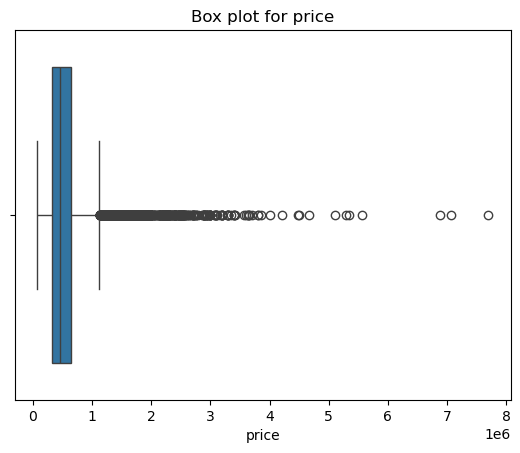

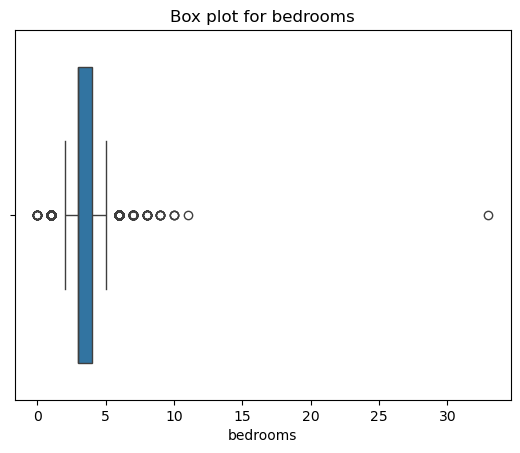

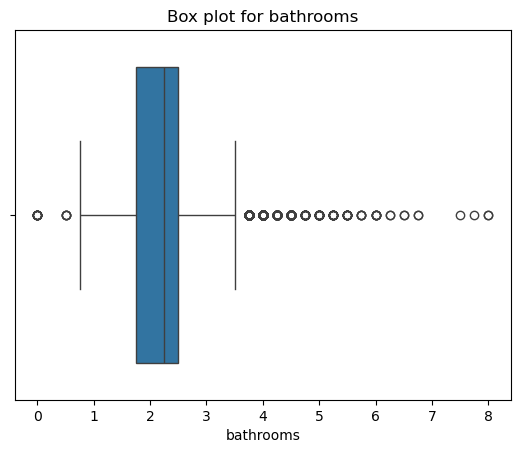

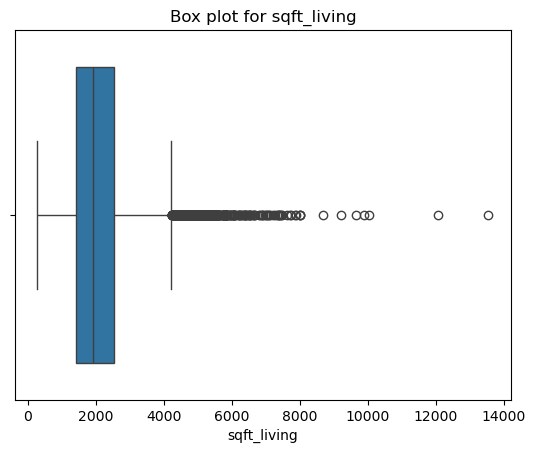

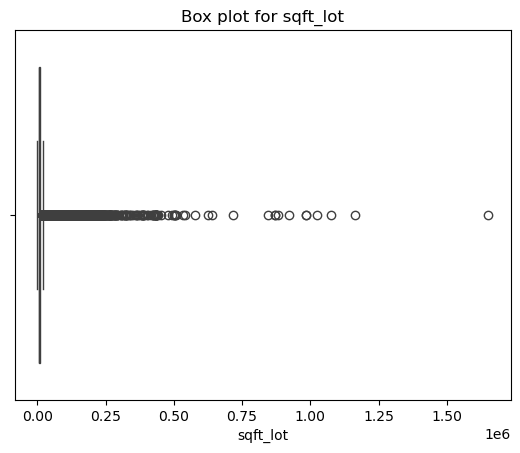

...

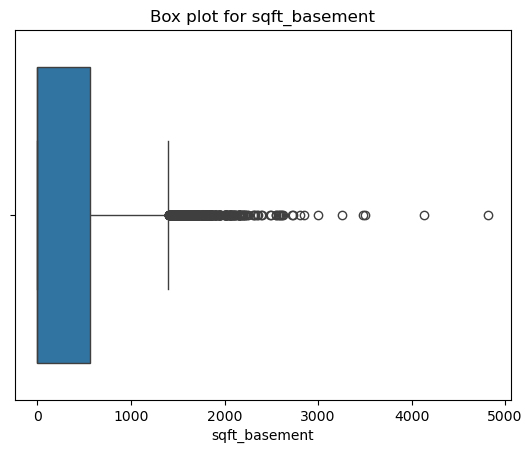

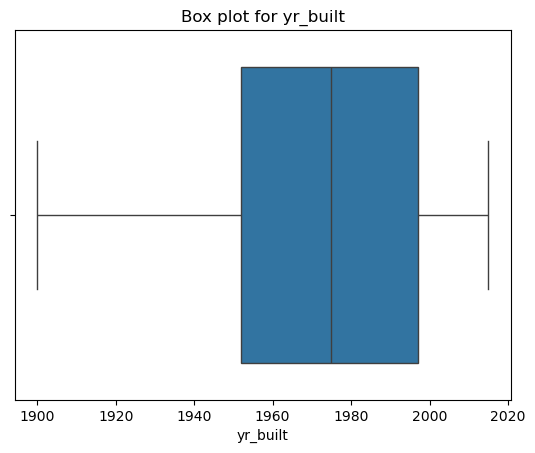

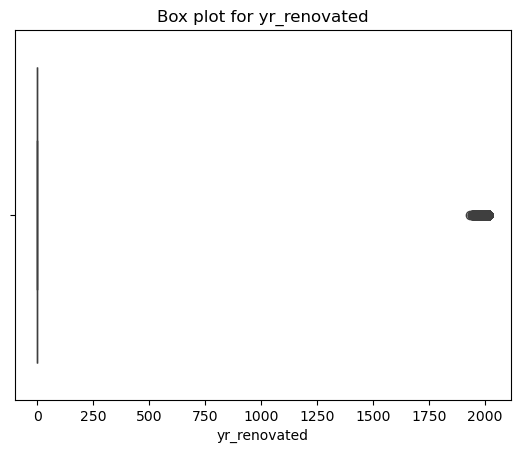

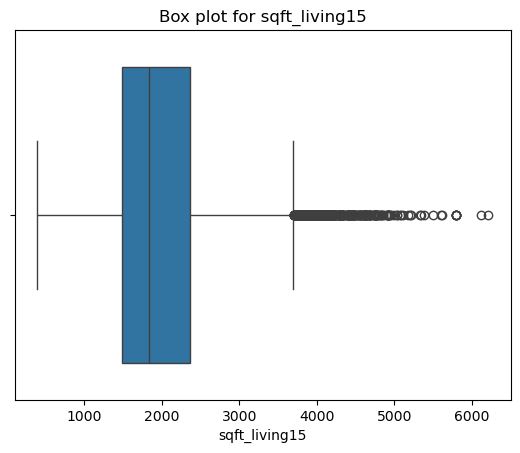

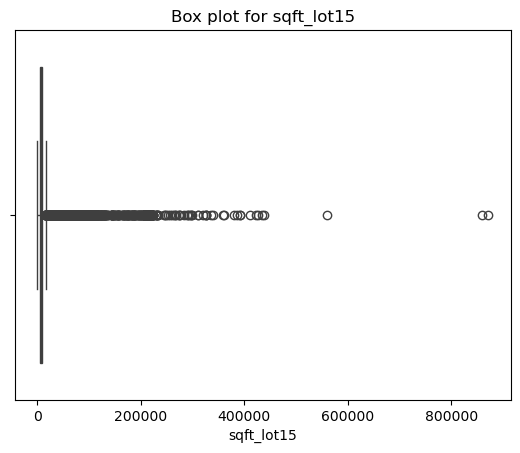

In [32]:
columns_to_display = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']


for column in columns_to_display:
    sns.boxplot(x=cleaned_df[column])
    plt.title(f'Box plot for {column}')
    plt.xlabel(f'{column}')
    plt.show()

Make sure to interpret each of the boxplots which help you determine whether to keep or drop the outliers.

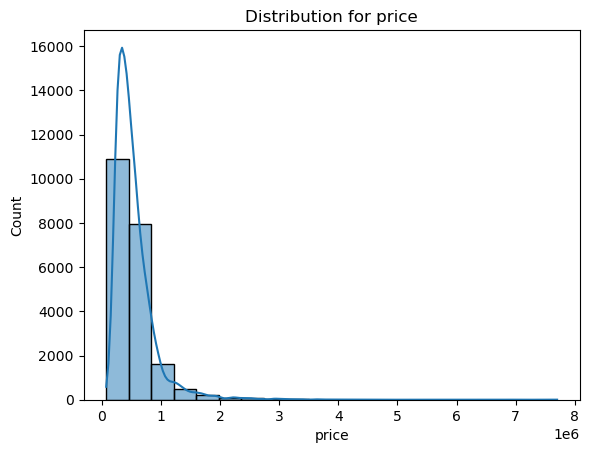

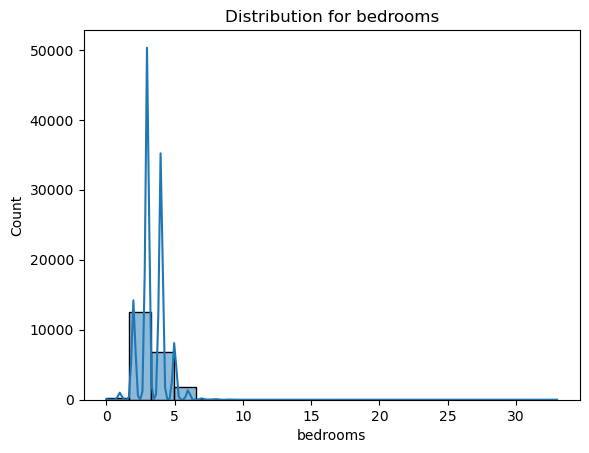

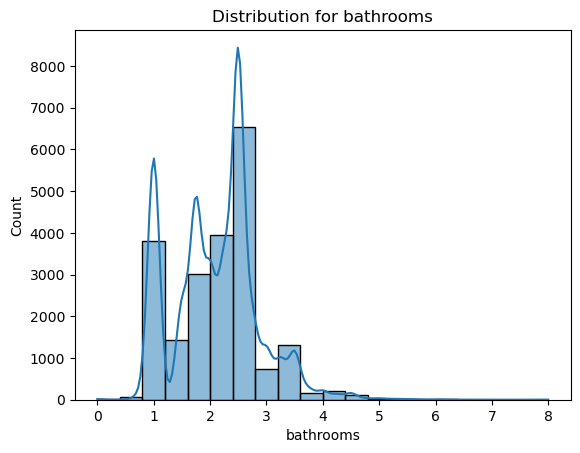

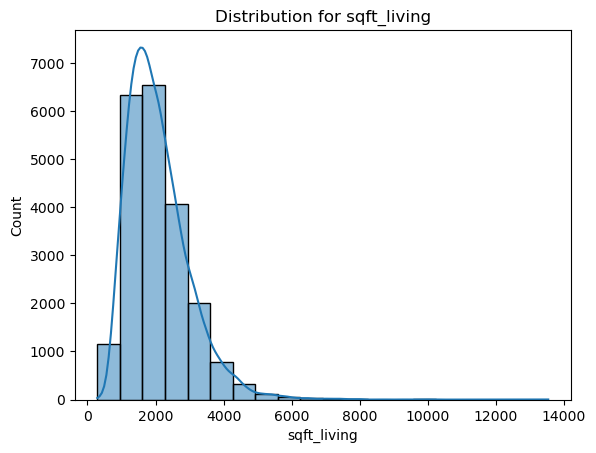

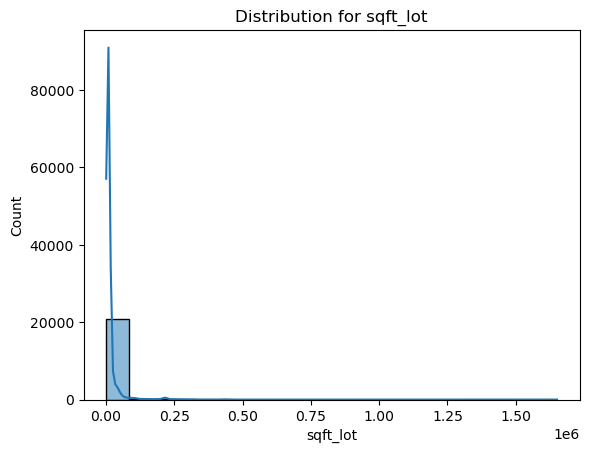

...

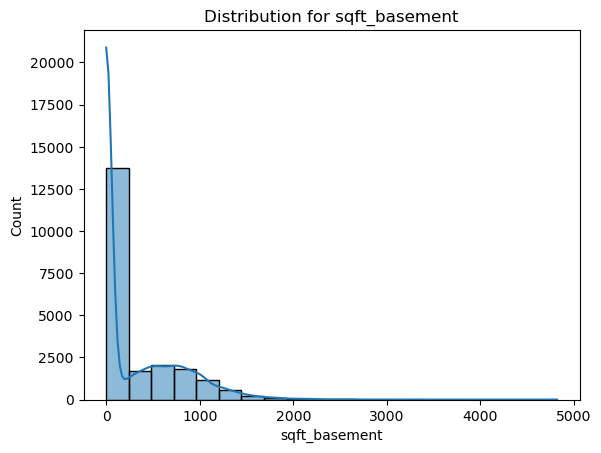

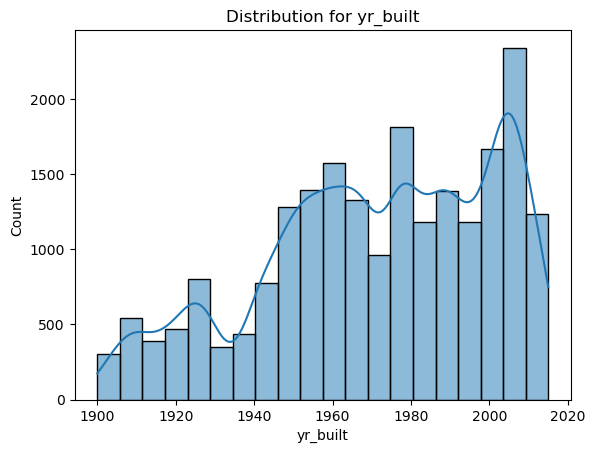

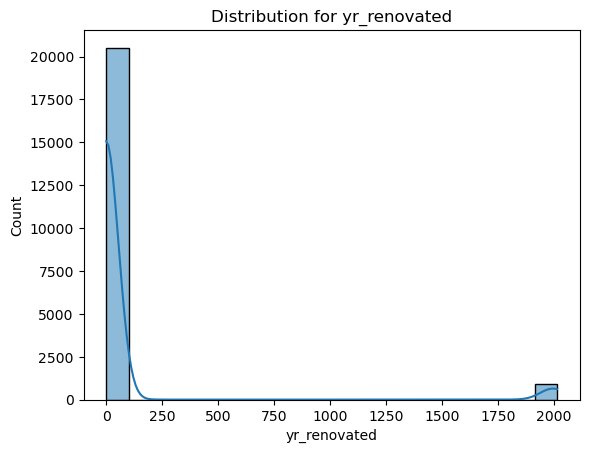

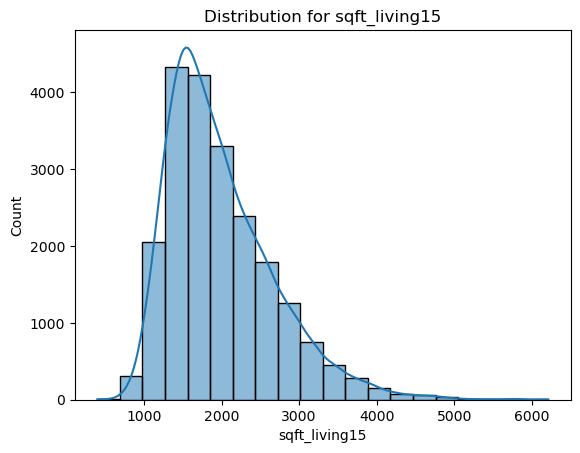

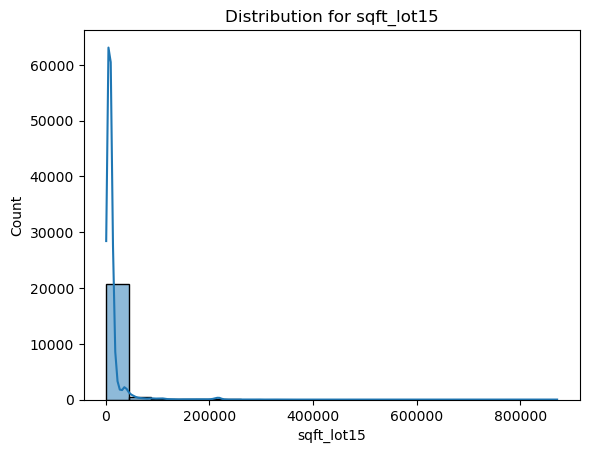

In [33]:
for column in columns_to_display:
    sns.histplot(x=cleaned_df[column], bins=20, kde=True)
    plt.title(f'Distribution for {column}')
    plt.xlabel(f'{column}')
    plt.show()

Interpret the visualizations and determine how to handle the columns without normal distribution.


### Bivariate

In [34]:
cleaned_df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

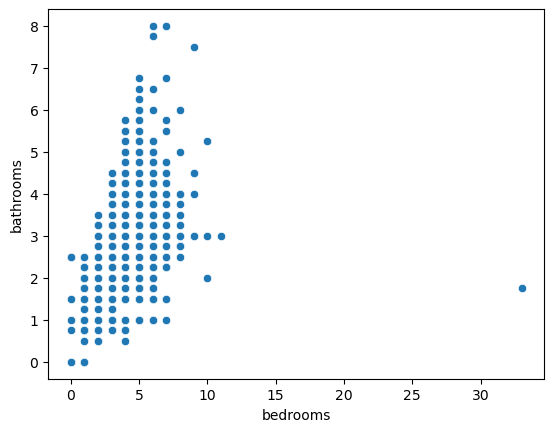

In [35]:
# bed & bath
sns.scatterplot(x=cleaned_df['bedrooms'],  y = cleaned_df['bathrooms'])
plt.show()

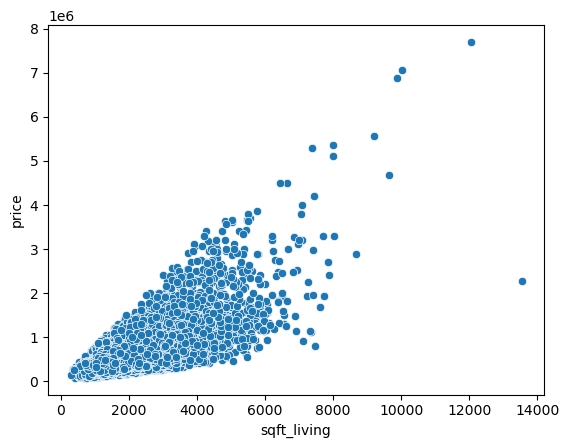

In [36]:
""" 
['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']
"""
sns.scatterplot(x=cleaned_df['sqft_living'],  y = cleaned_df['price'])
plt.show()

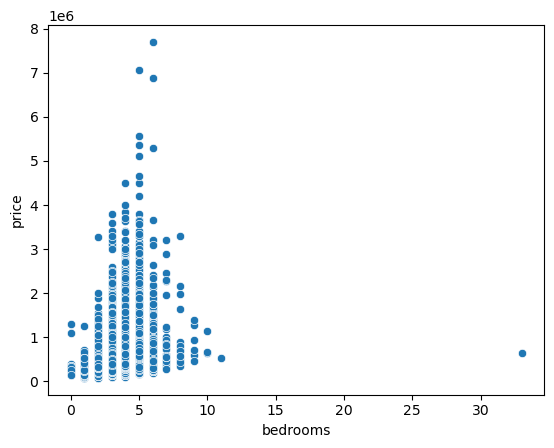

In [37]:
""" 
['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']
"""
sns.scatterplot(x=cleaned_df['bedrooms'],  y = cleaned_df['price'])
plt.show()

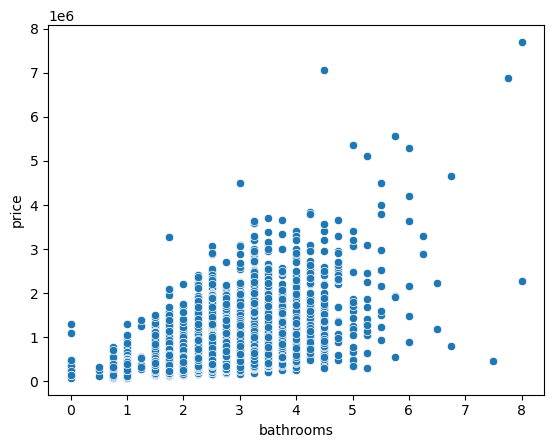

In [38]:
""" 
['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']
"""
sns.scatterplot(x=cleaned_df['bathrooms'],  y = cleaned_df['price'])
plt.show()

Interpretation of the visualization.

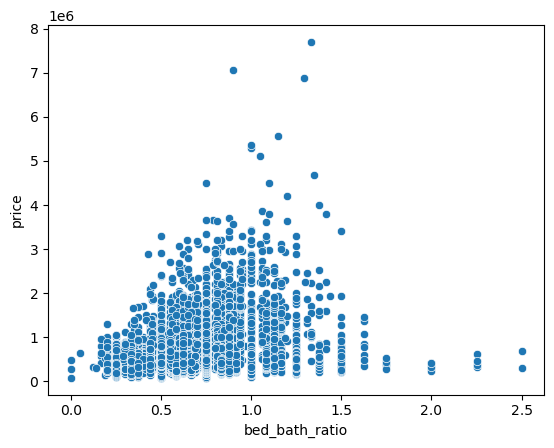

In [39]:
""" 
['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']
"""
cleaned_df['bed_bath_ratio'] = cleaned_df['bathrooms']/cleaned_df['bedrooms']

sns.scatterplot(x=cleaned_df['bed_bath_ratio'],  y = cleaned_df['price'])
plt.show()

Make sure to interpet the previous cell's visualization.

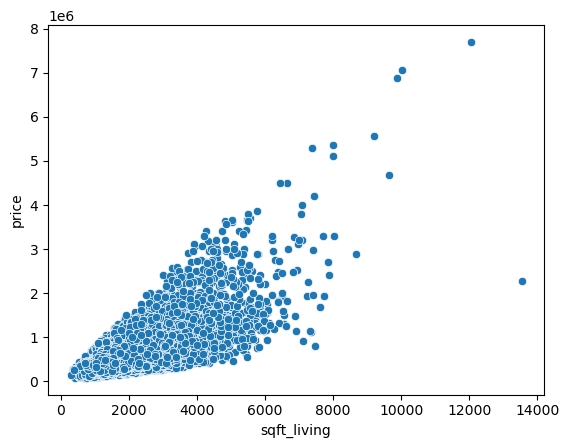

In [40]:
##### Multivariate analysis

""" 
['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15']
"""
sns.scatterplot(x=cleaned_df['sqft_living'],  y = cleaned_df['price'])
plt.show()

### Modelling
Create our first baseline model.

In [41]:
#importation
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression

In [42]:
#separate features and target
cleaned_df = cleaned_df.dropna()

x = cleaned_df.drop(['price', 'id'], axis=1)
y = cleaned_df['price']

In [43]:
#splitting the dataset into train and test
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=0.3)

x_train.shape
y_train.shape

(15000,)

In [44]:
#modelling
# sm.OLS(y_train, sm.add_constant(x_train)).summary()

In [48]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15000 entries, 17193 to 15947
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   bedrooms        15000 non-null  int64  
 1   bathrooms       15000 non-null  float64
 2   sqft_living     15000 non-null  int64  
 3   sqft_lot        15000 non-null  int64  
 4   floors          15000 non-null  float64
 5   waterfront      15000 non-null  int64  
 6   view            15000 non-null  int64  
 7   condition       15000 non-null  int64  
 8   grade           15000 non-null  int64  
 9   sqft_above      15000 non-null  int64  
 10  sqft_basement   15000 non-null  int64  
 11  yr_built        15000 non-null  int64  
 12  yr_renovated    15000 non-null  int64  
 13  sqft_living15   15000 non-null  int64  
 14  sqft_lot15      15000 non-null  int64  
 15  bed_bath_ratio  15000 non-null  float64
dtypes: float64(3), int64(13)
memory usage: 1.9 MB


In [45]:
#instantiate model
linear = LinearRegression()

linear.fit(x_train, y_train)



ValueError: Input X contains infinity or a value too large for dtype('float64').